<a href="https://colab.research.google.com/github/felixlapalma/monitoreo-espacios-verdes-diplo202X/blob/main/notebooks-tp/Aprendizaje_Supervisado_MEV_Aplicacion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    !apt install gdal-bin python-gdal python3-gdal 
    !apt install python3-rtree 
    !pip install descartes
    %cd /content
    !rm -r /content/*
    # git clone
    !git clone https://github.com/felixlapalma/sat-img-download-tutorial
    !pwd
    %cd sat-img-download-tutorial
    !pip install -r requirements-colab.txt
    %cd notebooks
    import sys
    sys.path.append('..')
else:
    print('Running on Local')
    import sys
    sys.path.append('..')

Running on CoLab
Reading package lists... Done
Building dependency tree       
Reading state information... Done
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  python3-numpy
Suggested packages:
  python-numpy-doc python3-nose python3-numpy-dbg
The following NEW packages will be installed:
  python3-gdal python3-numpy
0 upgraded, 2 newly installed, 0 to remove and 20 not upgraded.
Need to get 2,288 kB of archives.
After this operation, 13.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python3-numpy amd64 1:1.13.3-2ubuntu1 [1,943 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 python3-gdal amd64 2.2.3+dfsg-2 [346 kB]
Fetched 2,288 kB in 1s (2,578 kB/s)
Selecting prev

/content/sat-img-download-tutorial/notebooks


In [1]:
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    %cd sat-img-download-tutorial/notebooks
    import sys
    sys.path.append('..')

Running on CoLab
/content/sat-img-download-tutorial/notebooks


# Mentoria: Monitoreo de Espacios Verdes

__DIPLODATOS 2022 - FAMAF UNC__

_Felix Rojo Lapalma_

## Aprendizaje Supervisado: Caso de Aplicación

En esta notebook mostramos un paso a paso (simplificado) de la secuencia:

1. Descarga del Set de Datos$^1$
2. Curacion (Recetas TP Exploración y Curación)
3. Generacion de Features Extras$^2$
4. Split Dataset
5. Entrenamiento del Modelo
6. Presentacion de Resultados y Metricas
7. Descarga de Nuevos Datos
8. Inferencia

 
### Fuentes

El presente trabajo práctico está inspirado en los correspondientes de:

- [TP-Analisis-Visualizacion](https://github.com/felixlapalma/monitoreo-espacios-verdes-diplo202X/blob/main/notebooks-tp/Analisis-y-Visualizacion-MEV-TP.ipynb)

- [TP-Exploracion-y-Curación](https://drive.google.com/file/d/1-E0ijX7LTRczoAwYG7eAyfDb5PElyEfi/view?usp=sharing)

- [TP- Aprendizaje-Supervisado](https://github.com/felixlapalma/monitoreo-espacios-verdes-diplo202X/blob/main/notebooks-tp/Aprendizaje_Supervisado_MEV_TP.ipynb)


- [TP- Aprendizaje-Supervisado-Ejemplo](https://github.com/felixlapalma/monitoreo-espacios-verdes-diplo202X/blob/main/notebooks-tp/Aprendizaje_Supervisado_MEV_TP_Example.ipynb)


## [1] Descarga de Datos

In [2]:
import pandas as pd
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    %cd /content
    # running on colab
    # from link @ https://github.com/felixlapalma/monitoreo-espacios-verdes-diplo202X/blob/main/data/ab-initio-dataset-build.md
    !gdown https://drive.google.com/file/d/1tgbIQaEXzIghcFYyd2YM9iMho4TDHHFd/view?usp=sharing --fuzzy
    !gdown https://drive.google.com/file/d/1mfir4DZxT3g9tQkPJzCAZYy2VS2VHp7O/view?usp=sharing --fuzzy
    # Notar el cambio del path y el tipo de archivo (no lo descomprimimos)
    df_verde=pd.read_csv('/content/espacios-verdes-indexs-cba-20170101-20220420.zip',index_col=0)
    df_no_verde=pd.read_csv('/content/espacios-NO-verdes-indexs-cba-20170101-20220420.zip',index_col=0)
else:
    # recuerde descargar el dataset desde los links mencionados en el README
    df_verde=pd.read_csv('../data/cba/espacios-verdes-indexs-cba-20170101-20220420.csv',index_col=0)
    df_no_verde=pd.read_csv('/data/cba/espacios-NO-verdes-indexs-cba-20170101-20220420.csv',index_col=0)

Running on CoLab
/content
Downloading...
From: https://drive.google.com/uc?id=1tgbIQaEXzIghcFYyd2YM9iMho4TDHHFd
To: /content/espacios-verdes-indexs-cba-20170101-20220420.zip
100% 170M/170M [00:05<00:00, 28.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1mfir4DZxT3g9tQkPJzCAZYy2VS2VHp7O
To: /content/espacios-NO-verdes-indexs-cba-20170101-20220420.zip
100% 78.7M/78.7M [00:00<00:00, 92.8MB/s]


- asignacion de clase
- seleccion de las bandas, indices indicados a continuacion (en su mediana) y algunos componentes extras.

In [3]:
# actualizamos los dataframes con la asignacion de clase
df_verde['target']=1 # espacio verde
df_no_verde['target']=0 # espacio NO verde -> En primera instancia suponemos todos espacios no verdes
#
case= ['B02_median',
 'B03_median',
 'B04_median',
 'B05_median',
 'B07_median',
 'B08_median',
 'B11_median',
 'ndvi_median',
 'mNDVI_median',
 'osavi_median',
 'tcari_median',
 'clouds_on_raster',
 'raster',
 'osm_id',
 'area_m2',
 'date',
 'target'];

In [4]:
# get case
df_vf=df_verde[case] 
df_nvf=df_no_verde[case]

## 2. Curación (Receta Minimal)

- Drop NaN
- Filter Clouds on Raster (< 30%)

In [5]:
df_0=pd.concat([df_vf.dropna(),df_nvf.dropna()])
df_1=df_0[df_0['clouds_on_raster']<30]
df_1.head()

,B02_median,B03_median,B04_median,B05_median,B07_median,B08_median,B11_median,ndvi_median,mNDVI_median,osavi_median,tcari_median,clouds_on_raster,raster,osm_id,area_m2,date,target
0,0.09650,0.09340,0.0779,0.1157,0.2459,0.2645,0.18770,0.547001,1.301351,0.435000,0.093993,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,605976736,4650.710032,2017-01-03,1
1,0.10660,0.11010,0.0988,0.1482,0.3080,0.3329,0.25420,0.534292,1.059602,0.453745,0.103725,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559322368,1502.000513,2017-01-03,1
2,0.11290,0.11870,0.1062,0.1405,0.3116,0.3415,0.24640,0.525454,1.057045,0.448569,0.092038,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559322369,2004.192528,2017-01-03,1
3,0.11355,0.11865,0.1037,0.1512,0.3647,0.3928,0.26675,0.593190,1.072501,0.515213,0.112404,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559328111,6940.507640,2017-01-03,1
4,0.12240,0.13190,0.1219,0.1722,0.3450,0.3773,0.28950,0.508717,1.012175,0.447423,0.123183,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559328112,4587.356048,2017-01-03,1


## 3. Generacion de Features Extras

In [6]:
def prc_dates(df,col='date',drop_col=True):

  df[col]=pd.to_datetime(df[col])
  df['month']=df[col].apply(lambda x: x.month)
  df['year']=df[col].apply(lambda x: x.year)
  df['week']=df[col].apply(lambda x:float(x.strftime('%U')))
  if drop_col:
    df.drop(col,axis=1,inplace=True)
  return df
#
df_2=prc_dates(df_1.copy())
df_2.head()

,B02_median,B03_median,B04_median,B05_median,B07_median,B08_median,B11_median,ndvi_median,mNDVI_median,osavi_median,tcari_median,clouds_on_raster,raster,osm_id,area_m2,target,month,year,week
0,0.09650,0.09340,0.0779,0.1157,0.2459,0.2645,0.18770,0.547001,1.301351,0.435000,0.093993,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,605976736,4650.710032,1,1,2017,1.0
1,0.10660,0.11010,0.0988,0.1482,0.3080,0.3329,0.25420,0.534292,1.059602,0.453745,0.103725,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559322368,1502.000513,1,1,2017,1.0
2,0.11290,0.11870,0.1062,0.1405,0.3116,0.3415,0.24640,0.525454,1.057045,0.448569,0.092038,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559322369,2004.192528,1,1,2017,1.0
3,0.11355,0.11865,0.1037,0.1512,0.3647,0.3928,0.26675,0.593190,1.072501,0.515213,0.112404,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559328111,6940.507640,1,1,2017,1.0
4,0.12240,0.13190,0.1219,0.1722,0.3450,0.3773,0.28950,0.508717,1.012175,0.447423,0.123183,0.0,S2A_MSIL1C_20170103T142022_N0204_R010_T20JLL_2...,559328112,4587.356048,1,1,2017,1.0


4. Split Dataset

In [7]:
from sklearn.model_selection import train_test_split
#
def pd_Xy_splitter(pd_in,x_list,y_list):
    # dummy function to split pd
    if y_list!=None:
        X,y= pd_in.loc[:,x_list],pd_in.loc[:,y_list]
    else:
        X,y= pd_in.loc[:,x_list],None    
    return X,y


In [8]:
x_case= ['B02_median',
 'B03_median',
 'B04_median',
 'B05_median',
 'B07_median',
 'B08_median',
 'B11_median',
 'ndvi_median',
 'mNDVI_median',
 'osavi_median',
 'tcari_median',
 'month',
 'week'
 ];
y_case=['target']

In [9]:
XY_train,XY_test=train_test_split(df_2,test_size=0.3,random_state=1)
#
X_train,Y_train = pd_Xy_splitter(XY_train,x_case,y_case)
X_test,Y_test = pd_Xy_splitter(XY_test,x_case,y_case)

In [10]:
# helpers
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score
import itertools
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues,color_bar=False):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    if color_bar:
        plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Etiqueta correcta')
    plt.xlabel('Etiqueta predicha')

def print_plot_classification_report(model,X_case,Y_case,Case,plotFlag=False,classes_list=['NO_CASE','CASE']):
    print(Case)
    print("Reporte de clasificación para el mejor clasificador (sobre conjunto " + Case+"):", end="\n\n")
    y_true, y_pred = Y_case, model.predict(X_case)
    cr_pd=classification_report(y_true, y_pred,target_names=classes_list)
    cr_dict=classification_report(y_true, y_pred,target_names=classes_list,output_dict=True)
    print(cr_pd, end="\n\n")
    print("================================================", end="\n\n")
    if plotFlag:
        plot_confusion_matrix(confusion_matrix(y_true, y_pred),
                      classes=classes_list, title= Case)
        plt.show()
    return cr_dict

## 5. Entrenamiento

In [11]:
from sklearn.ensemble import RandomForestClassifier

In [12]:
rf=RandomForestClassifier()


### Train

In [13]:
#Case
X_case=X_train; Y_case=Y_train ; Case= 'TRAIN';

model=rf
# Fit
model.fit(X_case,Y_case.values.ravel())

RandomForestClassifier()

### 6. Resultados

TRAIN
Reporte de clasificación para el mejor clasificador (sobre conjunto TRAIN):

              precision    recall  f1-score   support

    NO_VERDE       1.00      1.00      1.00     51393
       VERDE       1.00      1.00      1.00    110109

    accuracy                           1.00    161502
   macro avg       1.00      1.00      1.00    161502
weighted avg       1.00      1.00      1.00    161502





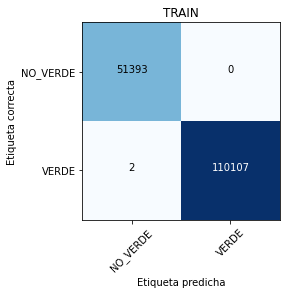

{'NO_VERDE': {'precision': 0.9999610857087265,
  'recall': 1.0,
  'f1-score': 0.9999805424757754,
  'support': 51393},
 'VERDE': {'precision': 1.0,
  'recall': 0.9999818361805121,
  'f1-score': 0.9999909180077743,
  'support': 110109},
 'accuracy': 0.9999876162524303,
 'macro avg': {'precision': 0.9999805428543633,
  'recall': 0.999990918090256,
  'f1-score': 0.9999857302417748,
  'support': 161502},
 'weighted avg': {'precision': 0.9999876167343351,
  'recall': 0.9999876162524303,
  'f1-score': 0.9999876163166743,
  'support': 161502}}

In [14]:
print_plot_classification_report(model,X_case,Y_case,Case,plotFlag=True,classes_list=['NO_VERDE','VERDE'])

TEST
Reporte de clasificación para el mejor clasificador (sobre conjunto TEST):

              precision    recall  f1-score   support

    NO_VERDE       0.86      0.70      0.77     21732
       VERDE       0.87      0.95      0.91     47484

    accuracy                           0.87     69216
   macro avg       0.86      0.82      0.84     69216
weighted avg       0.87      0.87      0.86     69216





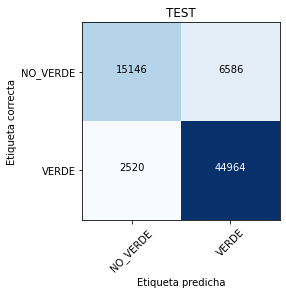

{'NO_VERDE': {'precision': 0.8573531076644402,
  'recall': 0.6969445978280876,
  'f1-score': 0.7688715163206254,
  'support': 21732},
 'VERDE': {'precision': 0.8722405431619786,
  'recall': 0.9469294920394238,
  'f1-score': 0.9080517801967001,
  'support': 47484},
 'accuracy': 0.8684408229311142,
 'macro avg': {'precision': 0.8647968254132095,
  'recall': 0.8219370449337557,
  'f1-score': 0.8384616482586628,
  'support': 69216},
 'weighted avg': {'precision': 0.8675662807337466,
  'recall': 0.8684408229311142,
  'f1-score': 0.8643528450580782,
  'support': 69216}}

In [15]:
X_case_test=X_test; Y_case_test=Y_test ; Case_test='TEST'

print_plot_classification_report(model,X_case_test,Y_case_test,Case_test,plotFlag=True,classes_list=['NO_VERDE','VERDE'])


## Descarga del Set de Datos Nuevos para Inferencia

Utilizamos lo expuesto en:

- [sat-img-download-tutorial](https://github.com/felixlapalma/sat-img-download-tutorial)


### Recorte de Imagen Completa (L1C)

Descargamos una imagen completa y la recortamos a la zona de interes. Este nivel de procesamiento de la imagen (L1C) es identico al utilizado en los datos de entrenamiento (mas adelante veremos que esto no es estrictamente necesario)

In [16]:
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
import geopandas as gpd
import os
from earthpy import plot
import matplotlib.pyplot as plt

In [17]:
creds_file=False
if creds_file:
    with open('../data/rois/credentials/sentinelhub.json','r') as f:
        config=json.load(f)
    user_=config['user']
    pass_=config['pass']
else:
  if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    import getpass
    from getpass import getpass
    user_ = getpass('Enter the user value: ')
    pass_ = getpass('Enter the pass value: ')
  else:
    user_='XXXXXX' ## fill with your own creds
    pass_='XXXXXX' ## fill

Running on CoLab
Enter the user value: ··········
Enter the pass value: ··········


In [18]:
api = SentinelAPI(user_, pass_)

In [19]:
%cd /content/sat-img-download-tutorial
# search by polygon, time, and SciHub query keywords
footprint = geojson_to_wkt(read_geojson('data/rois/san-roque-dam.geojson'))
#
# pick a roi
roi=gpd.read_file('data/rois/san-roque-dam.geojson')
#
products = api.query(footprint,
                     date=('20220801', '20220831'),
                     platformname='Sentinel-2',
                     cloudcoverpercentage=(0, 10))
#
# convert to Pandas DataFra<me
products_s2 = api.to_dataframe(products)
#
dow=products_s2[products_s2.processinglevel =='Level-1C']
dow

/content/sat-img-download-tutorial


,title,link,link_alternative,link_icon,summary,ondemand,generationdate,beginposition,endposition,ingestiondate,...,platformserialidentifier,processinglevel,datastripidentifier,granuleidentifier,identifier,uuid,datatakesensingstart,sensoroperationalmode,tileid,hv_order_tileid
3f75e717-47fe-48d3-ad84-d3f0dfed15b3,S2B_MSIL1C_20220827T140709_N0400_R110_T20JLL_2...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,"Date: 2022-08-27T14:07:09.024Z, Instrument: MS...",false,2022-08-27 17:33:38,2022-08-27 14:07:09.024,2022-08-27 14:07:09.024,2022-08-27 20:08:36.646,...,Sentinel-2B,Level-1C,S2B_OPER_MSI_L1C_DS_2BPS_20220827T173338_S2022...,S2B_OPER_MSI_L1C_TL_2BPS_20220827T173338_A0285...,S2B_MSIL1C_20220827T140709_N0400_R110_T20JLL_2...,3f75e717-47fe-48d3-ad84-d3f0dfed15b3,2022-08-27 14:07:09.024,INS-NOBS,20JLL,JL20L
551865d3-db13-4a5e-8d9e-e41fc37ca4aa,S2A_MSIL1C_20220822T140721_N0400_R110_T20JLL_2...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,"Date: 2022-08-22T14:07:21.024Z, Instrument: MS...",false,2022-08-22 19:18:06,2022-08-22 14:07:21.024,2022-08-22 14:07:21.024,2022-08-22 21:46:43.699,...,Sentinel-2A,Level-1C,S2A_OPER_MSI_L1C_DS_ATOS_20220822T191806_S2022...,S2A_OPER_MSI_L1C_TL_ATOS_20220822T191806_A0374...,S2A_MSIL1C_20220822T140721_N0400_R110_T20JLL_2...,551865d3-db13-4a5e-8d9e-e41fc37ca4aa,2022-08-22 14:07:21.024,INS-NOBS,20JLL,JL20L
d3e3f134-fa5d-4579-882a-f1d887eafac6,S2A_MSIL1C_20220812T140721_N0400_R110_T20JLL_2...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,"Date: 2022-08-12T14:07:21.024Z, Instrument: MS...",false,2022-08-12 19:17:59,2022-08-12 14:07:21.024,2022-08-12 14:07:21.024,2022-08-12 22:05:35.387,...,Sentinel-2A,Level-1C,S2A_OPER_MSI_L1C_DS_ATOS_20220812T191759_S2022...,S2A_OPER_MSI_L1C_TL_ATOS_20220812T191759_A0372...,S2A_MSIL1C_20220812T140721_N0400_R110_T20JLL_2...,d3e3f134-fa5d-4579-882a-f1d887eafac6,2022-08-12 14:07:21.024,INS-NOBS,20JLL,JL20L
cc0b3b3d-e934-4eeb-80f6-f0d1e7bde35a,S2A_MSIL1C_20220805T141721_N0400_R010_T20JLL_2...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,https://apihub.copernicus.eu/apihub/odata/v1/P...,"Date: 2022-08-05T14:17:21.024Z, Instrument: MS...",false,2022-08-05 19:29:06,2022-08-05 14:17:21.024,2022-08-05 14:17:21.024,2022-08-05 21:56:40.488,...,Sentinel-2A,Level-1C,S2A_OPER_MSI_L1C_DS_ATOS_20220805T192906_S2022...,S2A_OPER_MSI_L1C_TL_ATOS_20220805T192906_A0371...,S2A_MSIL1C_20220805T141721_N0400_R010_T20JLL_2...,cc0b3b3d-e934-4eeb-80f6-f0d1e7bde35a,2022-08-05 14:17:21.024,INS-NOBS,20JLL,JL20L


In [20]:
os.makedirs('../TMP-images-raw',exist_ok=True)
api.download_all(dow.head(1).index,directory_path='../TMP-images-raw/')

MD5 checksumming:   0%|          | 0.00/504M [00:00<?, ?B/s]

ResultTuple(downloaded={'3f75e717-47fe-48d3-ad84-d3f0dfed15b3': {'id': '3f75e717-47fe-48d3-ad84-d3f0dfed15b3', 'title': 'S2B_MSIL1C_20220827T140709_N0400_R110_T20JLL_20220827T173338', 'size': 503707561, 'md5': '438967dc009c695478cd4af81a8a927e', 'date': datetime.datetime(2022, 8, 27, 14, 7, 9, 24000), 'footprint': 'POLYGON((-64.7655 -31.70991668020977,-64.75925 -31.68884494128064,-64.71658 -31.54168402753668,-64.67291 -31.394877345901488,-64.629974 -31.24782415703995,-64.58655 -31.10094443882996,-64.54364 -30.953854009445536,-64.50073 -30.80678189604604,-64.47626 -30.72287264560284,-63.94217 -30.72910890902974,-63.952057 -31.719688572333347,-64.7655 -31.70991668020977))', 'url': "https://apihub.copernicus.eu/apihub/odata/v1/Products('3f75e717-47fe-48d3-ad84-d3f0dfed15b3')/$value", 'Online': True, 'Creation Date': datetime.datetime(2022, 8, 27, 20, 9, 24, 912000), 'Ingestion Date': datetime.datetime(2022, 8, 27, 20, 8, 36, 646000), 'quicklook_url': "https://apihub.copernicus.eu/apihub/o

In [21]:
product_zip=dow.head(1)['title'][0]

In [22]:
from eo_forge.io.SentinelLoaders import Sentinel2Loader

In [23]:
# Now Extract the Package
from zipfile import ZipFile
with ZipFile(f'../TMP-images-raw/{product_zip}.zip', 'r') as zipObj:
    zipObj.extractall(path='../TMP-images-raw/')

In [24]:
# Init Loader and query bands
# Notice that we do not include SCL in this case. It is auto added by the 
SENTINEL2_BANDS = ["B02", "B03", "B04", "B05", "B06", "B07", "B8A", "B08", "B11", "B12"]
IMAGES_RAW='../TMP-images-raw/'
lp = Sentinel2Loader(IMAGES_RAW, bands=SENTINEL2_BANDS, resolution=10,level='l1c')
#
# Set product ID
product_id=f'{product_zip}.SAFE'
#
PROD_INT_DIR='../TMP-images-proc'
os.makedirs(PROD_INT_DIR,exist_ok=True)
#
res_bbox_on = lp.execute(
    product_id,
    bbox=roi,
    folder_proc_=PROD_INT_DIR,
    raster_return_open=True,
    calibrate=True,
)

Forcing clouds_legacy to True (cloud mask from gml file- MSK_CLOUDS_B00 or new (from 20220125) jp2 file - MSK_CLASSI_B00.jp2)


In [25]:
res_bbox_on

{'raster': <open DatasetReader name='/vsimem/999c3885-0813-4a24-96b5-c679570d56a8/999c3885-0813-4a24-96b5-c679570d56a8.tif' mode='r'>,
 'raster_cloud': <open DatasetReader name='/vsimem/f24f9883-3984-4c09-b790-4b1ab2e81709/f24f9883-3984-4c09-b790-4b1ab2e81709.tif' mode='r'>,
 'match': 'TOTAL',
 'raster_path': None,
 'raster_cloud_path': None}

Text(0.5, 1.0, 'Cloud Mask')

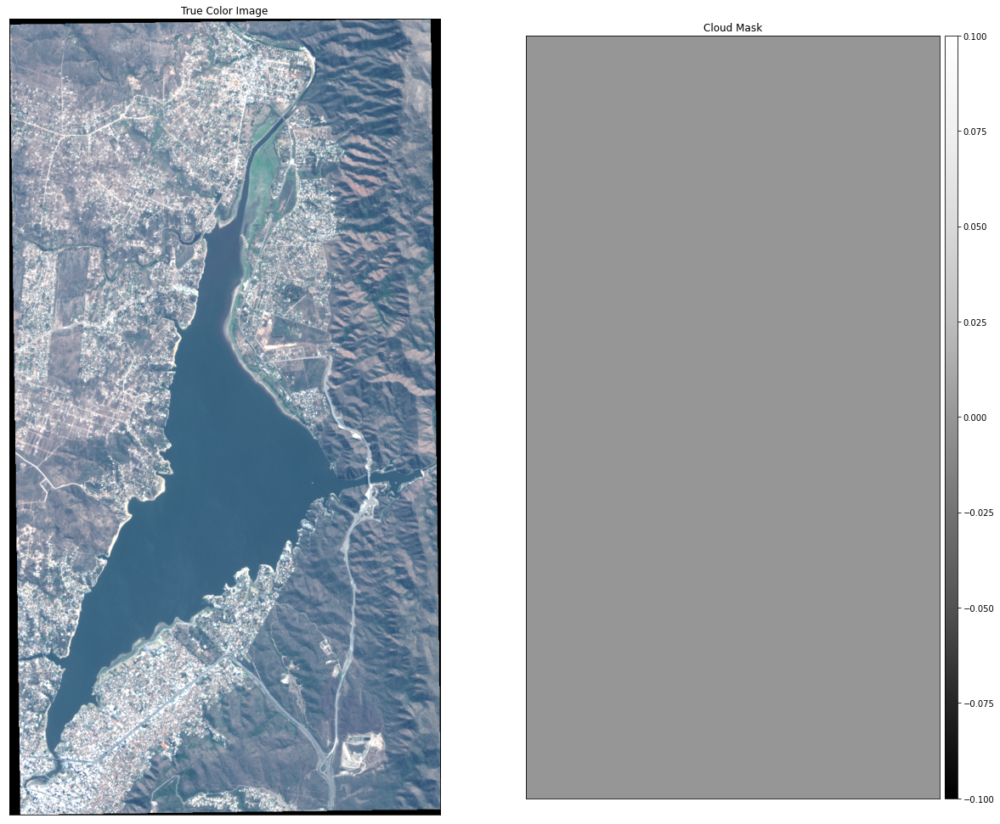

In [26]:
f, ax = plt.subplots(1, 2, figsize=(20, 20))
raster = res_bbox_on["raster"]
plot.plot_rgb(raster.read(), rgb=(2, 1, 0), ax=ax[0],stretch=True)
ax[0].set_title("True Color Image")

raster = res_bbox_on["raster_cloud"]
plot.plot_bands(raster.read(), ax=ax[1])
ax[1].set_title("Cloud Mask")

Estos son los datos que tenemos que procesar para llevarlos al formato de inferencia.

In [27]:
# ahora armemos un dataframe con las bandas
todataframe={}
raster = res_bbox_on["raster"]
for band,data in zip(SENTINEL2_BANDS,raster.read()):
  todataframe.update({band:data.squeeze().reshape(-1,1).flatten()})
#
df_cal=pd.DataFrame(todataframe)
df_cal.head()

,B02,B03,B04,B05,B06,B07,B8A,B08,B11,B12
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Necesitamos computar los indices 
 - 'ndvi_median'
 - 'mNDVI_median'
 - 'osavi_median'
 - 'tcari_median'

 Que son los que utilizamos para entrenar

In [28]:
import numpy as np
import rasterio as rio
def get_ndi(
    band_1,
    band_2,
    weight=[1.0, 1.0],
    dtype=rio.float32,
    bands_nodata=0,
    nodata=-10000.0,
):
    """
    :param
    """

    band_1 = np.where(band_1 == bands_nodata, np.nan, band_1)
    band_2 = np.where(band_2 == bands_nodata, np.nan, band_2)
    ndi_num = weight[0] * band_1.astype(dtype) - weight[1] * band_2.astype(dtype)
    ndi_den = band_1.astype(dtype) * weight[0] + band_2.astype(dtype) * weight[1]
    np.seterr(divide="ignore", invalid="ignore")
    ndi = ndi_num / ndi_den
    np.nan_to_num(ndi, copy=False, nan=nodata)

    return ndi


def get_mNDVI(
    band_1,
    band_2,
    band_3,
    weight=[1.0, 1.0, 1.0],
    dtype=rio.float32,
    bands_nodata=0,
    nodata=-10000.0,
):
    """
    :param
    (B08-B04)/(B08+B04-2*B02)
    """

    band_1 = np.where(band_1 == bands_nodata, np.nan, band_1)
    band_2 = np.where(band_2 == bands_nodata, np.nan, band_2)
    band_3 = np.where(band_3 == bands_nodata, np.nan, band_3)

    band_1 = band_1.astype(dtype) * weight[0]
    band_2 = band_2.astype(dtype) * weight[1]
    band_3 = band_3.astype(dtype) * weight[2]

    ndi_num = band_1 - band_2
    ndi_den = band_1 + band_2 - 2.0 * band_3
    np.seterr(divide="ignore", invalid="ignore")
    ndi = ndi_num / ndi_den
    np.nan_to_num(ndi, copy=False, nan=nodata)

    return ndi

def get_OSAVI(
    band_1,
    band_2,
    weight=[1.0, 1.0],
    dtype=rio.float32,
    bands_nodata=0,
    nodata=-10000.0,
):
    """
    :param
    """
    band_1 = np.where(band_1 == bands_nodata, np.nan, band_1)
    band_2 = np.where(band_2 == bands_nodata, np.nan, band_2)

    band_1 = band_1.astype(dtype) * weight[0]
    band_2 = band_2.astype(dtype) * weight[1]

    num = band_1 - band_2
    den = band_1 + band_2 + 0.16
    np.seterr(divide="ignore", invalid="ignore")
    osavi = 1.16 * (num / den)
    np.nan_to_num(osavi, copy=False, nan=nodata)

    return osavi


def get_TCARI(
    band_1,
    band_2,
    band_3,
    weight=[1.0, 1.0, 1.0],
    dtype=rio.float32,
    bands_nodata=0,
    nodata=-10000.0,
):
    """
    :param
    """

    band_1 = np.where(band_1 == bands_nodata, np.nan, band_1)
    band_2 = np.where(band_2 == bands_nodata, np.nan, band_2)
    band_3 = np.where(band_3 == bands_nodata, np.nan, band_3)

    band_1 = band_1.astype(dtype) * weight[0]
    band_2 = band_2.astype(dtype) * weight[1]
    band_3 = band_3.astype(dtype) * weight[2]

    np.seterr(divide="ignore", invalid="ignore")
    ndi = 3 * ((band_1 - band_2) - 0.2 * (band_1 - band_3) * (band_1 / band_2))
    np.nan_to_num(ndi, copy=False, nan=nodata)

    return ndi


In [29]:
# (B08-B04)/(B08+B04)
df_cal['ndvi']=get_ndi(df_cal['B08'],df_cal['B04'],nodata=0)
# (B08-B04)/(B08+B04-2*B02)
df_cal['mNDVI']=get_mNDVI(df_cal['B08'],df_cal['B04'],df_cal['B02'],nodata=0)
# OSAVI
df_cal['osavi']=get_OSAVI(df_cal['B08'],df_cal['B04'],nodata=0)
# TCARI
df_cal['tcari']=get_OSAVI(df_cal['B05'],df_cal['B04'],df_cal['B03'],nodata=0)

In [30]:
# generamos algunos datos extras
df_cal['date']='2022-08-27'
df_cal_dates=prc_dates(df_cal)
#
df_cal_dates.head()

,B02,B03,B04,B05,B06,B07,B8A,B08,B11,B12,ndvi,mNDVI,osavi,tcari,month,year,week
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,2022,34.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,2022,34.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,2022,34.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,2022,34.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,2022,34.0


In [31]:
# Notemos que en este esquema estamos utilizando las propiedades por "pixel" por eso no aparece ningun estadistico
x_case= ['B02_median',
 'B03_median',
 'B04_median',
 'B05_median',
 'B07_median',
 'B08_median',
 'B11_median',
 'ndvi_median',
 'mNDVI_median',
 'osavi_median',
 'tcari_median',
 'month',
 'week'
 ];
 # Para que no salte esto en tiempo de inferencia vamos a renombrar las columnas
x_case_pixel=[x.replace('_median','') for x in x_case]
x_case_pixel

['B02',
 'B03',
 'B04',
 'B05',
 'B07',
 'B08',
 'B11',
 'ndvi',
 'mNDVI',
 'osavi',
 'tcari',
 'month',
 'week']

In [32]:
df_dummy=df_cal_dates[x_case_pixel]
df_dummy.columns=x_case

In [33]:
# efectuamos la prediccion
Y_new=model.predict(df_dummy)

In [34]:
# veamos que vio el clasificador
# armemos el raster, para ello veamos el tamaño original
raster.shape

(1333, 721)

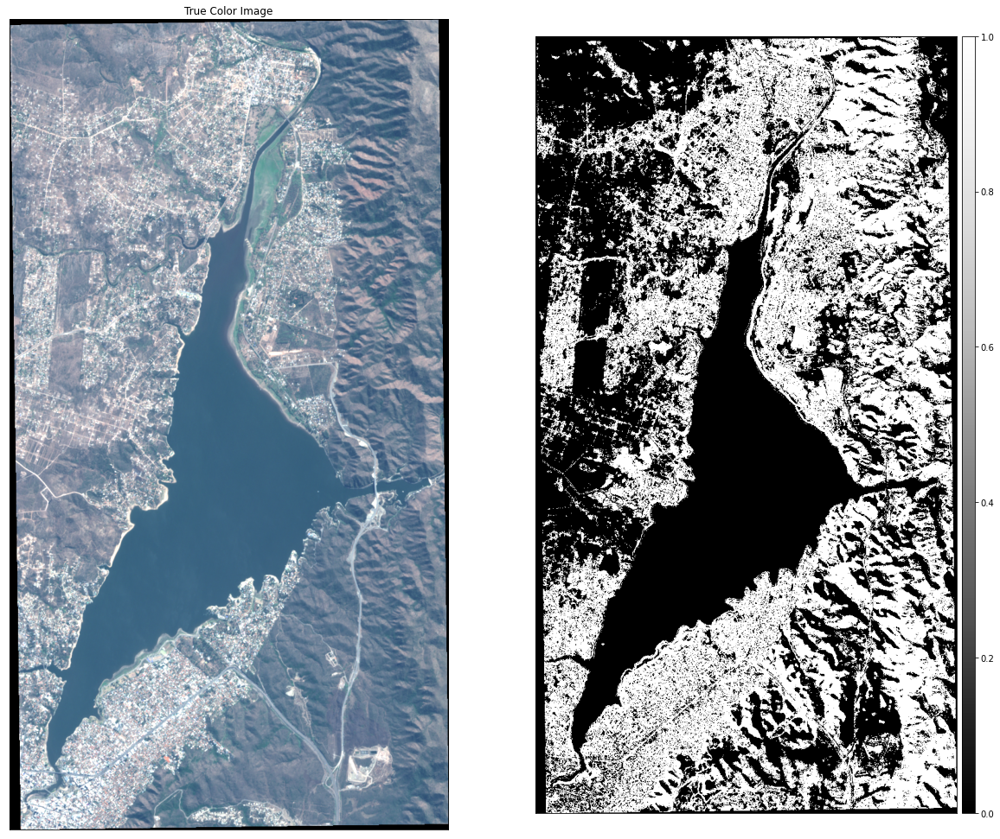

In [35]:
Y_new_mat=Y_new.reshape(1333,721)
#
f, ax = plt.subplots(1, 2, figsize=(20, 20))
raster = res_bbox_on["raster"]
plot.plot_rgb(raster.read(), rgb=(2, 1, 0), ax=ax[0],stretch=True)
ax[0].set_title("True Color Image")

plot.plot_bands(Y_new_mat,cmap="Greys_r",ax=ax[1])

Nuestro clasificador parece ser muy bueno para determinar areas que no son espacios verdes, pero no para lo opuesto.
Ahora veamos si con datos parecidos a los originales obtenemos algo similar

### Solo zona de interes (L2A)


In [36]:
%cd /content/sat-img-download-tutorial
import os
import geopandas as gpd
import matplotlib.pyplot as plt
from pystac_client import Client
from eo_tilematcher import intersects, get_spacecraft_db
from earthpy import plot
import json
import rasterio as rio
#
from src.helper import calibrate_s2_scl
from src.helper import get_stac_items
from src.helper import _get_bands_data_from_planetary
from src.helper import _assemble_raster

/content/sat-img-download-tutorial


In [37]:
#
catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
# pick a roi
roi=gpd.read_file('data/rois/san-roque-dam.geojson')

In [38]:
# This way is arbitrary
query= {"catalog": catalog,
        "time_of_interest": "2022-08-27/2022-08-28",
        "cloud_cover": 10,
        "bbox": roi.total_bounds.tolist()
       }

In [39]:
stac_ret = get_stac_items(query)
stac_ret

[<Item id=S2B_MSIL2A_20220827T140709_R110_T20JLL_20220829T120006>]

In [40]:
# pick one
item_container=stac_ret[0]

In [41]:
BANDS = ["B02", "B03", "B04", "B05", "B06", "B07", "B8A", "B08", "B11", "B12","SCL"]

b, p = _get_bands_data_from_planetary(
    item_container,
    BANDS,
    query['bbox'],
)
#
print(f"Bands: {b.keys()} \nProfiles: {p.keys()}\nB02\n - shape: {b['B02'].shape}\n - profile: {p['B02']}")

Bands: dict_keys(['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B8A', 'B08', 'B11', 'B12', 'SCL']) 
Profiles: dict_keys(['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B8A', 'B08', 'B11', 'B12', 'SCL'])
B02
 - shape: (1, 1333, 721)
 - profile: {'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 721, 'height': 1333, 'count': 1, 'crs': CRS.from_epsg(32720), 'transform': Affine(10.0, 0.0, 356910.0,
       0.0, -10.0, 6535760.0), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}


Text(0.5, 1.0, 'SCL - Only CLOUD_HIGH_PROBABILITY ')

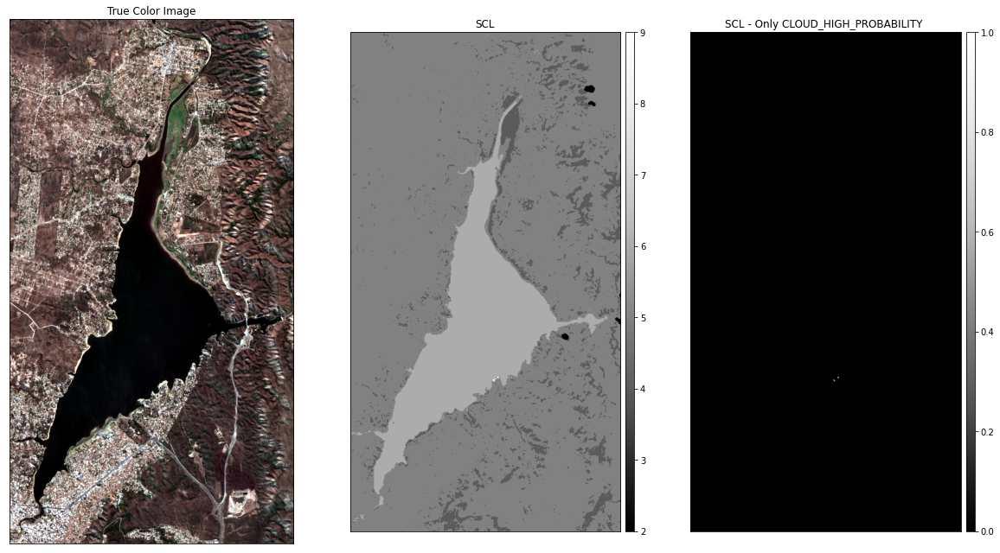

In [42]:
# Vemos lo que bajamos
f, ax = plt.subplots(1, 3, figsize=(20, 20))
raster_cog = _assemble_raster(b, p, ["B02", "B03", "B04", "B08", "B8A"])
plot.plot_rgb(raster_cog.read(), rgb=(2, 1, 0),ax=ax[0],stretch=True)
ax[0].set_title("True Color Image")

raster_cloud_cog = _assemble_raster(b, p, ["SCL"])
plot.plot_bands(raster_cloud_cog.read(),ax=ax[1])
ax[1].set_title("SCL")

# leave only 9 	CLOUD_HIGH_PROBABILITY
cloud_mask_cog = calibrate_s2_scl(raster_cloud_cog, [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11])
plot.plot_bands(cloud_mask_cog.read(),ax=ax[2])
ax[2].set_title("SCL - Only CLOUD_HIGH_PROBABILITY ")

In [43]:
# ahora armemos un dataframe con las bandas
todataframe={}
for band in BANDS:
  todataframe.update({band:b[band].squeeze().reshape(-1,1).flatten()})
#
df_new=pd.DataFrame(todataframe)
df_new.head()


,B02,B03,B04,B05,B06,B07,B8A,B08,B11,B12,SCL
0,1406,1470,1582,1858,2081,2211,2420,2400,2923,2359,5
1,1372,1459,1536,1754,2063,2163,2346,2318,2754,2247,5
2,1348,1450,1496,1754,2063,2163,2346,2314,2754,2247,5
3,1326,1464,1493,1709,2086,2268,2400,2346,2648,2125,5
4,1316,1459,1498,1709,2086,2268,2400,2538,2648,2125,5


Adicionalmente tenemos que recalibrar las bandas. En este punto comentamos que los datos con los cuales vamos a realizar la inferencia, si bien pertenecen a la misma plataforma no tienen el mismo nivel de procesamiento (L1C vs L2A).
Respecto a la calibracion las bandas tienen un ajuste del tipo:
$$ B_i=\frac{BAND_i+OFFSET}{QANTIFICATION_i}$$
Actualmente los offset y los valores de cuantificacion son los mismos para todas las bandas:
- OFFSET == - 1000
- QUANTIFICATION == 10000

In [44]:
df_cal=df_new.copy()
for b in [band for band in BANDS if 'B' in band]:
  df_cal[b]=(df_cal[b]-1000)/10000


In [45]:
# (B08-B04)/(B08+B04)
df_cal['ndvi']=get_ndi(df_cal['B08'],df_cal['B04'],nodata=0)
# (B08-B04)/(B08+B04-2*B02)
df_cal['mNDVI']=get_mNDVI(df_cal['B08'],df_cal['B04'],df_cal['B02'],nodata=0)
# OSAVI
df_cal['osavi']=get_OSAVI(df_cal['B08'],df_cal['B04'],nodata=0)
# TCARI
df_cal['tcari']=get_OSAVI(df_cal['B05'],df_cal['B04'],df_cal['B03'],nodata=0)

In [46]:
# generamos algunos datos extras
df_cal['date']='2022-08-27'
df_cal_dates=prc_dates(df_cal)
#
df_cal_dates.head()

,B02,B03,B04,B05,B06,B07,B8A,B08,B11,B12,SCL,ndvi,mNDVI,osavi,tcari,month,year,week
0,0.0406,0.0470,0.0582,0.0858,0.1081,0.1211,0.1420,0.1400,0.1923,0.1359,5,0.412714,0.699145,0.264902,0.009472,8,2022,34.0
1,0.0372,0.0459,0.0536,0.0754,0.1063,0.1163,0.1346,0.1318,0.1754,0.1247,5,0.421791,0.704505,0.262629,0.007572,8,2022,34.0
2,0.0348,0.0450,0.0496,0.0754,0.1063,0.1163,0.1346,0.1314,0.1754,0.1247,5,0.451934,0.734291,0.278264,0.008864,8,2022,34.0
3,0.0326,0.0464,0.0493,0.0709,0.1086,0.1268,0.1400,0.1346,0.1648,0.1125,5,0.463839,0.718618,0.287723,0.007491,8,2022,34.0
4,0.0316,0.0459,0.0498,0.0709,0.1086,0.1268,0.1400,0.1538,0.1648,0.1125,5,0.510805,0.740741,0.331793,0.007330,8,2022,34.0


In [47]:
# Notemos que en este esquema estamos utilizando las propiedades por "pixel" por eso no aparece ningun estadistico
x_case= ['B02_median',
 'B03_median',
 'B04_median',
 'B05_median',
 'B07_median',
 'B08_median',
 'B11_median',
 'ndvi_median',
 'mNDVI_median',
 'osavi_median',
 'tcari_median',
 'month',
 'week'
 ];
 # Para que no salte esto en tiempo de inferencia vamos a renombrar las columnas
x_case_pixel=[x.replace('_median','') for x in x_case]
x_case_pixel

['B02',
 'B03',
 'B04',
 'B05',
 'B07',
 'B08',
 'B11',
 'ndvi',
 'mNDVI',
 'osavi',
 'tcari',
 'month',
 'week']

In [48]:
df_dummy=df_cal_dates[x_case_pixel]
df_dummy.columns=x_case

In [49]:
# efectuamos la prediccion
Y_new_cog=model.predict(df_dummy)

Text(0.5, 1.0, 'Inference L1C')

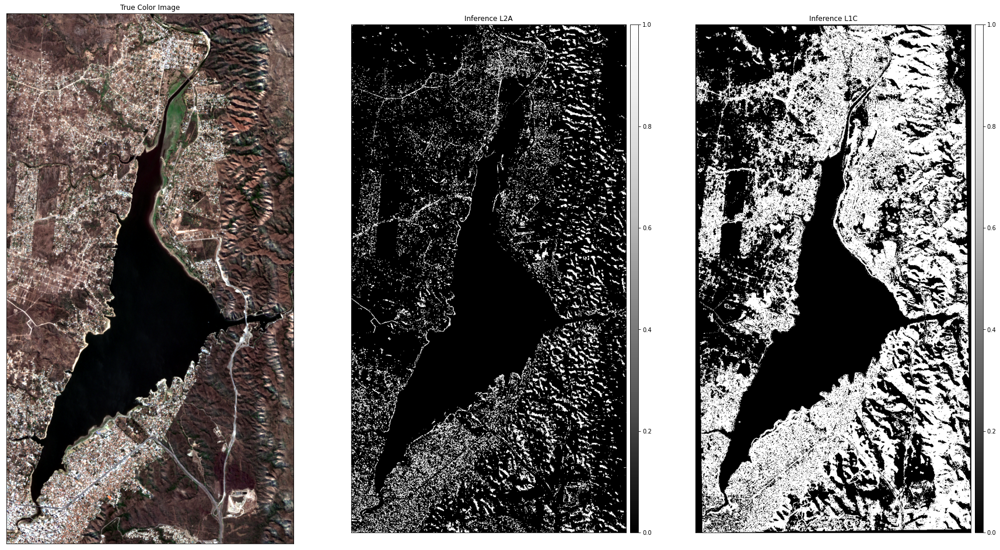

In [50]:
Y_new_cog_mat=Y_new_cog.reshape(1333,721)

f, ax = plt.subplots(1, 3, figsize=(30, 30))
plot.plot_rgb(raster_cog.read(), rgb=(2, 1, 0),ax=ax[0],stretch=True)
ax[0].set_title("True Color Image")
plot.plot_bands(Y_new_cog_mat,cmap="Greys_r",ax=ax[1])
ax[1].set_title("Inference L2A")
plot.plot_bands(Y_new_mat,cmap="Greys_r",ax=ax[2])
ax[2].set_title("Inference L1C")

Nuestro clasificador parece comportarse inclusive mejor que con los datos originales de entrenamiento. Tendra algo que ver la zona? Veamos con Cordoba misma.

In [51]:
!gdown https://drive.google.com/file/d/1l2k5-fuHCnIUbYaaMb_hXuuY75csb4ZP/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1l2k5-fuHCnIUbYaaMb_hXuuY75csb4ZP
To: /content/sat-img-download-tutorial/cordoba-cut-0.geojson
100% 321/321 [00:00<00:00, 507kB/s]


In [52]:
roi_cba=gpd.read_file('/content/sat-img-download-tutorial/cordoba-cut-0.geojson')

In [53]:
# This way is arbitrary
query= {"catalog": catalog,
        "time_of_interest": "2022-08-27/2022-08-28",
        "cloud_cover": 10,
        "bbox": roi_cba.total_bounds.tolist()
       }
       
stac_ret = get_stac_items(query)
stac_ret

[<Item id=S2B_MSIL2A_20220827T140709_R110_T20JLL_20220829T120006>]

In [54]:
# pick one
item_container=stac_ret[0]

BANDS = ["B02", "B03", "B04", "B05", "B06", "B07", "B8A", "B08", "B11", "B12","SCL"]

b, p = _get_bands_data_from_planetary(
    item_container,
    BANDS,
    query['bbox'],
)
#
print(f"Bands: {b.keys()} \nProfiles: {p.keys()}\nB02\n - shape: {b['B02'].shape}\n - profile: {p['B02']}")


Bands: dict_keys(['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B8A', 'B08', 'B11', 'B12', 'SCL']) 
Profiles: dict_keys(['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B8A', 'B08', 'B11', 'B12', 'SCL'])
B02
 - shape: (1, 588, 657)
 - profile: {'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 657, 'height': 588, 'count': 1, 'crs': CRS.from_epsg(32720), 'transform': Affine(10.0, 0.0, 383340.0,
       0.0, -10.0, 6526230.0), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}


Text(0.5, 1.0, 'SCL - Only CLOUD_HIGH_PROBABILITY ')

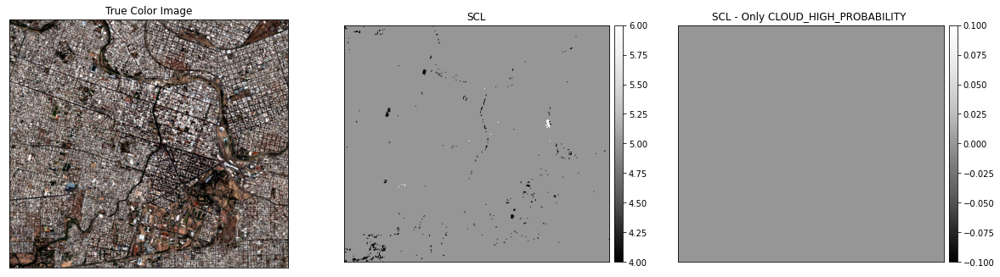

In [55]:
# Vemos lo que bajamos
f, ax = plt.subplots(1, 3, figsize=(20, 20))
raster_cog = _assemble_raster(b, p, ["B02", "B03", "B04", "B08", "B8A"])
plot.plot_rgb(raster_cog.read(), rgb=(2, 1, 0),ax=ax[0],stretch=True)
ax[0].set_title("True Color Image")

raster_cloud_cog = _assemble_raster(b, p, ["SCL"])
plot.plot_bands(raster_cloud_cog.read(),ax=ax[1])
ax[1].set_title("SCL")

# leave only 9 	CLOUD_HIGH_PROBABILITY
cloud_mask_cog = calibrate_s2_scl(raster_cloud_cog, [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11])
plot.plot_bands(cloud_mask_cog.read(),ax=ax[2])
ax[2].set_title("SCL - Only CLOUD_HIGH_PROBABILITY ")

In [56]:
# ahora armemos un dataframe con las bandas
todataframe={}
for band in BANDS:
  todataframe.update({band:b[band].squeeze().reshape(-1,1).flatten()})
#
df_new=pd.DataFrame(todataframe)
#
df_cal=df_new.copy()
for b in [band for band in BANDS if 'B' in band]:
  df_cal[b]=(df_cal[b]-1000)/10000


In [57]:
# (B08-B04)/(B08+B04)
df_cal['ndvi']=get_ndi(df_cal['B08'],df_cal['B04'],nodata=0)
# (B08-B04)/(B08+B04-2*B02)
df_cal['mNDVI']=get_mNDVI(df_cal['B08'],df_cal['B04'],df_cal['B02'],nodata=0)
# OSAVI
df_cal['osavi']=get_OSAVI(df_cal['B08'],df_cal['B04'],nodata=0)
# TCARI
df_cal['tcari']=get_OSAVI(df_cal['B05'],df_cal['B04'],df_cal['B03'],nodata=0)

In [58]:
  # generamos algunos datos extras
df_cal['date']='2022-08-27'
df_cal_dates=prc_dates(df_cal)
#
df_cal_dates.head()

,B02,B03,B04,B05,B06,B07,B8A,B08,B11,B12,SCL,ndvi,mNDVI,osavi,tcari,month,year,week
0,0.0808,0.0936,0.1182,0.1565,0.1789,0.1908,0.2059,0.1828,0.2380,0.2253,5,0.214618,0.463415,0.162551,0.016104,8,2022,34.0
1,0.0864,0.1020,0.1224,0.1565,0.1789,0.1908,0.2059,0.1898,0.2380,0.2253,5,0.215887,0.483501,0.165574,0.013412,8,2022,34.0
2,0.0916,0.1130,0.1278,0.1454,0.1730,0.1811,0.2055,0.2008,0.2368,0.2099,5,0.222155,0.502063,0.173311,0.003566,8,2022,34.0
3,0.0944,0.1160,0.1330,0.1454,0.1730,0.1811,0.2055,0.1938,0.2368,0.2099,5,0.186047,0.440580,0.144881,0.000269,8,2022,34.0
4,0.0960,0.1132,0.1312,0.1326,0.1616,0.1813,0.1878,0.1920,0.2309,0.2000,5,0.188119,0.463415,0.145960,-0.006063,8,2022,34.0


In [59]:
# Notemos que en este esquema estamos utilizando las propiedades por "pixel" por eso no aparece ningun estadistico
x_case= ['B02_median',
 'B03_median',
 'B04_median',
 'B05_median',
 'B07_median',
 'B08_median',
 'B11_median',
 'ndvi_median',
 'mNDVI_median',
 'osavi_median',
 'tcari_median',
 'month',
 'week'
 ];
 # Para que no salte esto en tiempo de inferencia vamos a renombrar las columnas
x_case_pixel=[x.replace('_median','') for x in x_case]
x_case_pixel


df_dummy=df_cal_dates[x_case_pixel]
df_dummy.columns=x_case

# efectuamos la prediccion
Y_new_cog=model.predict(df_dummy)

In [60]:
raster_cog.shape

(588, 657)

Text(0.5, 1.0, 'Inference L2A')

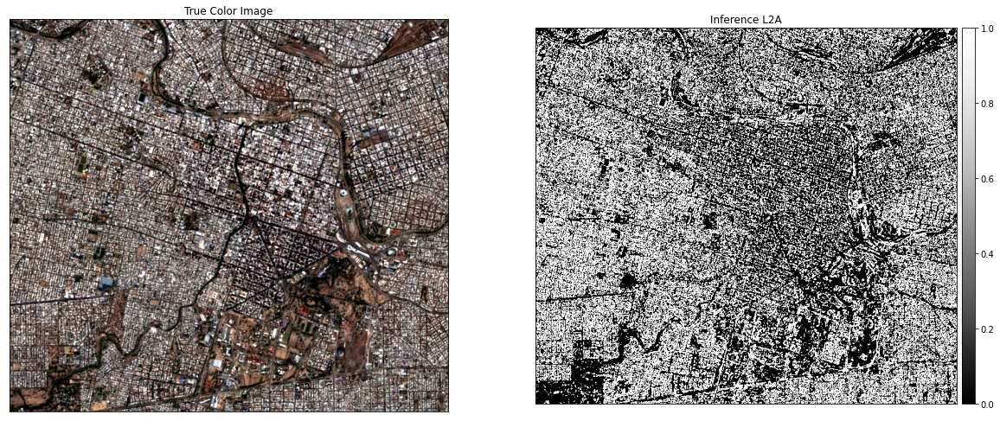

In [61]:
Y_new_cog_mat=Y_new_cog.reshape(588,657)

f, ax = plt.subplots(1, 2, figsize=(20, 20))
plot.plot_rgb(raster_cog.read(), rgb=(2, 1, 0),ax=ax[0],stretch=True)
ax[0].set_title("True Color Image")
plot.plot_bands(Y_new_cog_mat,cmap="Greys_r",ax=ax[1])
ax[1].set_title("Inference L2A")


No parece mejorar la cuestión. Sin embargo mencionamos que estamos considerando o utilizando un modelo entrenado a nivel de objetos (o zonas extensas) con zonas puntuales (pixeles).